## 外來及原生入侵種淡水魚分析
### Allian and Native Invasive Fresh Water fish Analysis

 <p style="text-align:right">特生中心 研究助理 曾子榮 <p/>

**I write this paragraph for the paper, especially for the data analysis part.** <br\>
**Maybe u guys can directly use it for the final paper after some modifications.** <br\>
***
#### Data analysis
> * Data Collection and Process
>> We collect data from from five different sources including (1) River Status Investigation (from Water Resource Agency), (2) Survey and Conservation Strategy of the Freshwater Fish Resources in Rivers, Lakes and Ponds of Taiwan (REF1), (3) Taiwan Fish Base, (4) Taiwan Biodiversity Information Facility, and (5) Taiwan Endemic Species Research Institute. Afterward, the data were cleased by removing obviously wrong data based on weird collected location and modifing species names due to taxonomical issues. To further filtered out irrelevant data, each observation with species names not in fresh water fish list in Taiwan (REF2) and located outside Taiwan island were removed. Finally, the five data sets were combined with only six variables included (scientific name, latitude, longitude, year, month, and source) and contained totally 45701 observations, 181 fresh water fish taxa, and ranged from 1915 to 2015. <br\> <br\>  
The data were not collected based on one single standard monitoring program, as a result, the method for collecting each observation in this data set differed a lot. Numerous independent surveys constitute the whole data set, and the only feasible way to examine **XXX pattern (this term should be already determined in the introduction part)** is just ask this simple question : how many times is a specific fish taxa appeared among the total independent surveys in a given time range and region? Let 'FA' stands for fish appearance and 'TE' stands for total effort (number of independent surveys), and the CPUE (Capture Per Unit Effort) is just FA diveded by TE. With such setting, we can model and visualize the change in CPUE for both targeted native and invasive fish species group together through time in a given region.<br\> <br\> 
**Define temporal and spatail scale** <br\>
The temporal scale in this study is first defined based on Zoogeographic distribution regions of fresh water fishes in Taiwan (REF3). Five distribution region (each included multiple basins) were defined based on it. However, this spatial scale of these distribution region is too rough considering our target native freshwater fish distribution. As a result, we further restrited the region based on the intersection of the basins which the target native species list have been suveyed in our data set. After defining the spatial scale, the temporal scale is desided by aggregation until at leasts 10 rule. There is no natural representation of how this temporal scale should be defined. So the only limitation is to reduced potenial bias come from skewed data distribution. In this data set, most surveys were conducted after 21th century. If we use a fixed temporal scale, such as every 5 years from 1915, then the most number of TE in each time block is zero before 21th century and more than 500 after 21th century. For alleviating this issue, we define dynamic temporal range of each time block by acculating TE until at least 10, and use the mid point of this temporal range as representation.


> * The Model
>> In our representation, CPUE is FA / TE. It's exactly a binomial probability model. Besides, due to time series structure of the data set, we assume what happended in this period shall be correlated from last period except some extreme event happened. Considering the assumptions, a beta-binomial model under baysian framework is used to estimate the true CPUE for each time block t for each fish species with: <br\> \begin{align}
FA[t] \sim Binomial(TE[t],CPUE[t]) \\\
\end{align}
Prior setting (**Informative prior**): 
\begin{align}
CPUE[t] \sim Beta(\alpha[t-1],\beta[t-1]) \\\
\end{align}
Where:
\begin{align}
\alpha[t-1] & = TE[t-1] \times mean(CPUE[t-1])\\
\beta[t-1] & = TE[t-1] \times (1 - mean(CPUE[t-1]))\\\
\end{align}
When t = 1 or extreme event happend: mean(CPUE[t-1]) $\times$ 10 $\geq$ (FA[t]/TE[t]) or mean(CPUE[t-1]) $\times$ 10 $\leq$ (FA[t]/TE[t]), use **Uninformative prior**:
\begin{align}
\alpha[t-1] & = 1 \\
\beta[t-1] & = 1 \\\
\end{align}
The model was implemented in PYMC3 where Makov chain monte carlo method with Metropolis–Hastings sampling was applied. 10000 iterations was conducted and the first 2500 was discarded as burn-in.


> * Visualization
>> (Maybe no need to mention?)
> * Explain the tool
>> All analysis is achieved by python 3.6 with the help of a bunch of libraries. See supplement material...(maybe just publish this notebook?) 


- REF1: I-Shiung Chen et al. 2010 Survey and Conservation Strategy of the Freshwater Fish Resources in Rivers, Lakes and Ponds of Taiwan 
- REF2: The Red List of Freshwater fishes of Taiwan, 2017
- REF3:台灣淡水及河口魚類誌 陳義雄、方力行 1999

***

1. 視覺化 - folium heatmap
***

In [3]:
%matplotlib inline
import pandas as pd
import pysal as ps
import matplotlib.path as mplPath
import matplotlib.pyplot as plt
import numpy as np
import folium
import folium.plugins as plugins
from datetime import datetime
import scipy
import os
import time
import json
import seaborn as sns

In [52]:
import IPython.core.display as di

# This line will hide code by default when the notebook is exported as HTML
di.display_html('<script>jQuery(function() {if (jQuery("body.notebook_app").length == 0) { jQuery(".input_area").toggle(); jQuery(".prompt").toggle();}});</script>', raw=True)

# This line will add a button to toggle visibility of code blocks, for use with the HTML export version
di.display_html('''<button onclick="jQuery('.input_area').toggle(); jQuery('.prompt').toggle();">Toggle code</button>''', raw=True)

Toggle code

In [5]:
DATA = pd.read_excel('2017-02-08_re_out_ALLGPS_mod.xlsx')

### Remove wierd names (sea water fishes??)
Name = pd.read_excel('FreshWaterFishNames.xlsx')
N = Name.iloc[:,0].tolist()
BOOL = [i in N for i in DATA.Scientific_name]
DATA = DATA[BOOL]
Polygons = ps.open('淡水魚分佈區\\CatchmentArea6_S_WGS84.shp').read()

### Remove pts not inside Taiwan
def PIPC(LAT,LON,polygon):
    '''
    Check whether a vector of points(Lat,Lon) is inside a polygon
    Return a vector of BOOL
    '''
    crd = np.array(polygon)# poly
    bbPath = mplPath.Path(crd)
    pnts = [[i,j] for i,j in zip(LON,LAT)] # points
    r = 0.001 # accuracy
    isIn = [ bbPath.contains_point(pnt,radius=r) or bbPath.contains_point(pnt,radius=-r) for pnt in pnts]
    return isIn

bools = []
for i in range(5):
    bools.append(PIPC(DATA.Latitude,DATA.Longitude,Polygons[i].vertices))

isInBool = [a or b or c or d or e for a,b,c,d,e in zip(bools[0],bools[1],bools[2],bools[3],bools[4])]

DATA = DATA[isInBool]

In [70]:
DATA.shape

(45701, 6)

In [6]:
from folium import IFrame
m = folium.Map(location=[24, 121], zoom_start=7, tiles="Stamen Terrain")
for i,c in zip(range(5),['#A9E6E6','#F2F062','#E67676','#94AC3C','#1E6262']):
    A = {"type": "FeatureCollection","features":\
          [{"type": "Feature","properties": {},"geometry":\
            {"type": "Polygon","coordinates": [Polygons[i].vertices]}}]}
    folium.GeoJson(A,name='geojson').add_to(m)
    m.choropleth(geo_data=A,fill_color=c,fill_opacity=0.7)
    
icon_url = ['https://image.flaticon.com/icons/svg/188/188253.svg',
           'https://image.flaticon.com/icons/svg/188/188254.svg',
           'https://image.flaticon.com/icons/svg/188/188255.svg',
           'https://image.flaticon.com/icons/svg/188/188256.svg',
           'https://image.flaticon.com/icons/svg/188/188257.svg']

def utf2asc(s):
    return str(str(s).encode('ascii', 'xmlcharrefreplace'))[2:-1]

heading3 = """<h3>{}</h3>""".format
region_name = ['北臺灣區','中臺灣區','南臺灣區','恆春半島西區','東臺灣區']
for N in range(5):
    icon = folium.features.CustomIcon(icon_image=icon_url[N],icon_size=(30, 30))
    iframe = IFrame(html=heading3(utf2asc(region_name[N])),width=200,height=40)
    folium.Marker((Polygons[N].centroid[1],Polygons[N].centroid[0]),popup=folium.Popup(iframe), icon=icon).add_to(m)
m

In [7]:
from folium.features import *
class DivIcon(MacroElement):
    def __init__(self, html='', size=(30,30), anchor=(0,0), style=''):
        """TODO : docstring here"""
        super(DivIcon, self).__init__()
        self._name = 'DivIcon'
        self.size = size
        self.anchor = anchor
        self.html = html
        self.style = style

        self._template = Template(u"""
            {% macro header(this, kwargs) %}
              <style>
                .{{this.get_name()}} {
                    {{this.style}}
                    }
              </style>
            {% endmacro %}
            {% macro script(this, kwargs) %}
                var {{this.get_name()}} = L.divIcon({
                    className: '{{this.get_name()}}',
                    iconSize: [{{ this.size[0] }},{{ this.size[1] }}],
                    iconAnchor: [{{ this.anchor[0] }},{{ this.anchor[1] }}],
                    html : "{{this.html}}",
                    });
                {{this._parent.get_name()}}.setIcon({{this.get_name()}});
            {% endmacro %}
            """)

In [8]:
# Accumulated HeatMap with Time
def Invasive_Heatmap_With_Time(fishname = 'Acrossocheilus paradoxus',I_Region=4,ALL = False):
    YY = [1985+y for y in range(32)]
    YY_index = [str(y) for y in YY]
    pts_DATA = []
    
    m = folium.Map(location=[24, 121], zoom_start=7,tiles='Stamen Terrain')

    if ALL == True:
        TTDATA = DATA.drop_duplicates(subset=['Latitude','Longitude','Year','Month','Source'],keep='first')
        for i in YY:
            before = i 
            BOOL = np.array(TTDATA.Year<=before)
            T_DATA = TTDATA[BOOL]
            pts_DATA.append([[i,j] for i,j in zip(T_DATA.Latitude,T_DATA.Longitude)])
        
        print('\033[1m'+'All independent surveys'+'\033[0m')
    else:
        for i in YY:
            before = i 
            BOOL = np.array(DATA.Year<=before)
            T_DATA = DATA[BOOL]
            T_DATA = T_DATA[T_DATA.Scientific_name==fishname]
            pts_DATA.append([[i,j] for i,j in zip(T_DATA.Latitude,T_DATA.Longitude)])

        #Add invasive region
        if I_Region in [0,1,2,3,4]:
            A = {"type": "FeatureCollection","features":\
                  [{"type": "Feature","properties": {},"geometry":\
                    {"type": "Polygon","coordinates": [Polygons[I_Region].vertices]}}]}
            folium.GeoJson(A,name='geojson').add_to(m)
            m.choropleth(geo_data=A,fill_opacity=0)

            folium.map.Marker(
                (Polygons[I_Region].centroid[1],Polygons[I_Region].centroid[0]),
                icon=DivIcon(
                    size=(150,0),
                    anchor=(0,0),
                    html='Invasive Region ({0})'.format(fishname),
                    style="""
                        font-size:12px;
                        text-align: right;
                        """
                    )
                ).add_to(m)
        print('\033[1m'+fishname+'\033[0m')

    hm = plugins.HeatMapWithTime(
        data=pts_DATA,
        use_local_extrema=True,
        index=YY_index,
        max_opacity=0.4,
        radius=8)


    hm.add_to(m)
    
    return m

In [9]:
Invasive_Heatmap_With_Time(fishname = 'Acrossocheilus paradoxus',I_Region=4)

Acrossocheilus paradoxus


In [10]:
Invasive_Heatmap_With_Time(fishname = 'Opsariichthys pachycephalus',I_Region=4)

Opsariichthys pachycephalus


In [11]:
Invasive_Heatmap_With_Time(fishname = 'Rhinogobius candidianus',I_Region=4)

Rhinogobius candidianus


In [12]:
Invasive_Heatmap_With_Time(fishname = 'Spinibarbus hollandi',I_Region=1)

Spinibarbus hollandi


I need to display unique surveys so we can understand potential errors from lacking of surveys.

In [13]:
Invasive_Heatmap_With_Time(ALL=True)

All independent surveys


** To fix IO for big visualization,**

jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000000

***
## Impact of invasive on native in Region V
***

***
#### Remove unfeasible regions to compare the impact of invasive on native
The steps are as follows:
1. Prepare the list of targeted native species in a given region, for example region V.
2. For each species in the list, return the Basin names where it had been surveyed.
3. Get the intersection of the Basin names for all species in the list.
4. Use the intersection as our restricted region to discuss the potential impact of invasive on native. A much smaller region than origin. 

***

**Prepare the Basin Polygons** <br\>
The Basin (kml) file can't be opened by pysal (after converting to shp)?? And the package (fastkml) to open kml really sucks! So, I use the most stupid way to open it. Read kml as pure text and parse it by regular expression.

In [14]:
import re
f = open("流域圖層\\Basin.kml",encoding='utf8').read()
p_name = re.compile('<name>(.*?)</name>')
p_coord = re.compile('<coordinates>(.*?)</coordinates>')

Basin_names = re.findall(p_name,f)[2::]
coord = re.findall(p_coord ,f)
Basin_coord = []

for i in coord:
    tt = i.replace('0 ','')
    tl = tt.split(',')
    tll = [float(i) for i in tl][:-1]
    tll_log = tll[0::2]
    tll_lat = tll[1::2]
    aa = []
    for i,j in zip(tll_log,tll_lat):
        aa.append((i,j))
    Basin_coord.append(aa)

# OK, the basin coord and name are ready to use now.

In [15]:
# Region V
Native_fishV = ['Spinibarbus hollandi','Aphyocypris kikuchii','Onychostoma alticorpus',
                'Onychostoma barbatulum','Rhinogobius gigas','Rhinogobius delicatus',
                'Tanakia himantegus','Candidia barbata']
Invasive_fishV = ['Acrossocheilus paradoxus','Opsariichthys pachycephalus','Rhinogobius candidianus']

RV_bool = PIPC(DATA.Latitude,DATA.Longitude,Polygons[4].vertices)
RV_data = DATA[RV_bool]

def GetBasin(data,fishlist = Native_fishV):
    Basin_dict = {}
    for fish in fishlist:
        dd = data[data.Scientific_name==fish]
        Bnames = []
        for i,b_coord in enumerate(Basin_coord):
            if sum(PIPC(dd.Latitude,dd.Longitude,b_coord)) > 0:
                Bnames.append(Basin_names[i])
        Basin_dict.update({fish:Bnames})
    return Basin_dict

BasinV_dict = GetBasin(RV_data,Native_fishV)

# Get the intersection of their basins
intersection_basin = list(set.intersection(*[set(BasinV_dict[k]) for k in BasinV_dict]))
## Use * to unpack list of sets and put in set.intersection to get the result

In [16]:
m = folium.Map(location=[23.00,121.1431], zoom_start=8,tiles='Stamen Terrain')

for basin in intersection_basin:    
    A = {"type": "FeatureCollection","features":\
      [{"type": "Feature","properties": {},"geometry":\
        {"type": "Polygon","coordinates": [Basin_coord[Basin_names.index(basin)]]}}]}
    folium.GeoJson(A,name='geojson').add_to(m)
    m.choropleth(geo_data=A,fill_opacity=0,line_color='black', line_weight=3)
m

In [17]:
#Let's just use data located in the two basins
Bs = []
for basin in intersection_basin: 
    Bs.append(PIPC(RV_data.Latitude,RV_data.Longitude,Basin_coord[Basin_names.index(basin)]))
Bool = [any(item) for item in zip(*Bs)]

res_data = RV_data[Bool].reset_index(drop=True)
#產出TEC and FA

# Should I use such year range as before?
# year_range = ['1800~1989','1990~1995','1996~2000','2001~2002','2003~2004','2005~2006','2007~2008','2009~2010','2011~2012','2013~2020']

def TEFAC(DataSet,YearRange,FishName):
    '''
    Total effort & Fish Appearance calculation, nead a dataset, a year range, and a list of fish names. 
    '''
    tec = []
    for yr in YearRange:
        y = [int(yy) for yy in yr.split('~')]
        Ybool = [a and b for a,b in zip(DataSet.Year>=y[0],DataSet.Year<=y[1])]
        temp_data = DataSet[Ybool].drop_duplicates(subset=['Latitude','Longitude','Year','Month','Source'],keep='first')
        tec.append(len(temp_data))
    
    all_FAC = {}
    for name in FishName:
        one_FAC = []
        for yr in YearRange:
            y = [int(yy) for yy in yr.split('~')]
            Ybool = [a and b for a,b in zip(DataSet.Year>=y[0],DataSet.Year<=y[1])]
            temp_data = DataSet[Ybool]
            one_FAC.append(len(temp_data[temp_data.Scientific_name==name]))
        all_FAC.update({name:one_FAC})
    
    all_FAC.update({'Total_Effort':tec})
    return pd.DataFrame(all_FAC,index=YearRange)

***
#### 年代範圍處理
***

In [18]:
T = res_data.drop_duplicates(subset=['Latitude','Longitude','Year','Month','Source'],keep='first')
print('---------------------')
print(T.Year.value_counts(sort=False))
print('---------------------')
print(T[T.Year<2002].Source.value_counts())
print('---------------------')
print(T[T.Year==2002].Source.value_counts())

---------------------
1919      2
1955      5
1956      1
1957      2
1978      2
1980      2
1981      3
1991      2
1992      5
1993      4
1994      5
1997      1
2001      1
2002     36
2003    142
2004     48
2005     84
2006     46
2007      1
2009      2
2010      7
2011      9
2012      5
2013      1
2014      6
Name: Year, dtype: int64
---------------------
TAIBIF    35
Name: Source, dtype: int64
---------------------
河川情勢調查            27
葉博                 4
TAIBIF             3
TBN_TESRI_Fish     2
Name: Source, dtype: int64


The year of data collected in this region skewed very much. Before 2002, there was only 35 surveys and all came from TAIBIF!
Year 2002 is the point where we found lots of invasive species all in a sudden.

Mayby a cuumulative until N (10?) strategy would alleviate the skewness problem?

** I should modify the fig, let its x axis more sense. (mid point of its year range)**

In [19]:
#Create a accumlated N year-range aggregator
def AcNyr(data,N=10):
    '''
    Try to make the sample size for each time block evenly distributed as possible.
    Set N is the minimum sample size for each time block
    Reture a list of year range and a list of mid point
    '''
    T = data.drop_duplicates(subset=['Latitude','Longitude','Year','Month','Source'],keep='first')
    k = T.Year.value_counts(sort=False)
    aa = k.index.tolist()
    aa.sort()
    Hi = k[aa]
    
    sum_N = 0
    yr = ''
    yrl = []
    for i,j in zip(Hi.index,Hi):
        if sum_N == 0:
            yr += str(i)
        
        sum_N += j
        if sum_N >=N:
            yr += '~'+str(i)
            sum_N = 0
            yrl += [yr]
            yr = ''
    #Do something for the last item in the loop if sum_N < 10
    if sum_N < N and sum_N >0:
        yr += '~'+'2016'
        yrl += [yr]
    return yrl,[(float(i.split('~')[0])+float(i.split('~')[1]))/2 for i in yrl]

In [20]:
year_range,mid_year = AcNyr(data=res_data,N=10)   

In [21]:
TEFACV = TEFAC(DataSet=res_data,YearRange=year_range,FishName=Native_fishV+Invasive_fishV)
TEFACV

,Acrossocheilus paradoxus,Aphyocypris kikuchii,Candidia barbata,Onychostoma alticorpus,Onychostoma barbatulum,Opsariichthys pachycephalus,Rhinogobius candidianus,Rhinogobius delicatus,Rhinogobius gigas,Spinibarbus hollandi,Tanakia himantegus,Total_Effort
1919~1957,0,1,0,1,1,0,0,0,0,1,0,10
1978~1992,0,1,0,0,0,0,0,1,1,0,0,14
1993~1997,0,0,0,2,0,0,0,2,1,1,0,10
2001~2002,19,0,0,12,1,29,12,11,18,8,0,37
2003~2003,61,1,1,27,13,112,32,42,71,32,9,142
2004~2004,40,0,10,1,12,33,30,39,18,1,1,48
2005~2005,30,11,5,25,13,41,13,0,36,17,6,84
2006~2006,19,3,3,5,10,28,7,1,24,7,6,46
2007~2010,2,0,0,2,0,1,1,0,3,1,2,10
2011~2012,1,0,1,3,0,9,8,4,2,3,1,14


In [22]:
# The model
import pymc3 as pm
def posterior_FA_ratio( FA, TE,alpha=1,beta=1,U=False,UL=[0,1], samples = 10000):
    with pm.Model() as model:
        if U == True:
            FA_ratio = pm.Uniform("FA_ratio", UL[0], UL[1])
        else:
            FA_ratio = pm.Beta("FA_ratio", alpha, beta)            
        observations = pm.Binomial( "obs",  TE, FA_ratio, observed=FA)        
        trace = pm.sample(samples, step=pm.Metropolis(),progressbar=False)    
    burned_trace = trace[int(samples/4):]
    return burned_trace['FA_ratio']

def beta_with_fixed_mu_sd(mu,sd):
    alpha = ((1.-mu)/sd**2 - 1./mu)*mu**2 #the lasy bug fromhere should be owing to var VS sd.
    beta = alpha *(1. /mu -1.)
    return [alpha,beta]

def Run_model(FA,TE,Name):
    OFAR = []
    print('Run model for '+Name+':')
    for i in range(len(FA)):
        if i ==0:
            print('    T = 1: USE Un-informative prior')
            OFAR.append(posterior_FA_ratio(FA[i],TE[i]))
        else:
#             a,b = beta_with_fixed_mu_sd(OFAR[i-1].mean(),OFAR[i-1].std()) # first way to determine the hyper-parameter
#             a,b,__,__ = scipy.stats.beta.fit(OFAR[i-1]) # second way
            ## The third way, reference from here http://www.obscureanalytics.com/2012/07/04/to-the-basics-bayesian-inference-on-a-binomial-proportion/
            # Use sample size N to control the precision of prior, great idea!
            N = TE[i-1]
            mu = OFAR[i-1].mean()
            a = N*mu
            b = N*(1-mu)
        
            if a < 0:
                print(a,b)
            if OFAR[i-1].mean()*10 < FA[i]/TE[i] and TE[i]>10:
                print('    T = '+str(i+1)+': Extreme event appear! mu:'+str(round(OFAR[i-1].mean(),3))+' VS FA/TE: '+str(round(FA[i]/TE[i],3))+', USE Un-informative prior!')
                OFAR.append(posterior_FA_ratio(FA[i],TE[i],alpha=1,beta=1))
            elif OFAR[i-1].mean() > 0.1 and OFAR[i-1].mean()*0.1 > FA[i]/TE[i] +0.001 and TE[i]>10:
                print('    T = '+str(i+1)+': Extreme event appear! mu:'+str(round(OFAR[i-1].mean(),3))+' VS FA/TE: '+str(round(FA[i]/TE[i],3))+', USE Un-informative prior!')
                OFAR.append(posterior_FA_ratio(FA[i],TE[i],alpha=1,beta=1))
#             elif OFAR[i-1].mean()<=0.001:
#                 print('    T = '+str(i+1)+': Posterior of mu[T-1] is too small, USE uniform(0,0.1) as informative prior')
#                 OFAR.append(posterior_FA_ratio(FA[i],TE[i],U=True,UL=(0,0.1)))
            else:
                print('    T = '+str(i+1)+': Use informative prior (T-1)')
                OFAR.append(posterior_FA_ratio(FA[i],TE[i],alpha=a,beta=b))

    DD = np.array(OFAR).T
    return DD

In [46]:
#Run model
out_dict = {}
for fish in Native_fishV+Invasive_fishV:
    out_dict.update({fish:Run_model(FA=TEFACV[fish].tolist(),TE=TEFACV.Total_Effort.tolist(),Name=fish).tolist()})

Run model for Spinibarbus hollandi:
    T = 1: USE Un-informative prior
    T = 2: Extreme event appear! mu:0.165 VS FA/TE: 0.0, USE Un-informative prior!
    T = 3: Use informative prior (T-1)
    T = 4: Use informative prior (T-1)
    T = 5: Use informative prior (T-1)
    T = 6: Use informative prior (T-1)
    T = 7: Use informative prior (T-1)
    T = 8: Use informative prior (T-1)
    T = 9: Use informative prior (T-1)
    T = 10: Use informative prior (T-1)
    T = 11: Use informative prior (T-1)
Run model for Aphyocypris kikuchii:
    T = 1: USE Un-informative prior
    T = 2: Use informative prior (T-1)
    T = 3: Use informative prior (T-1)
    T = 4: Use informative prior (T-1)
    T = 5: Use informative prior (T-1)
    T = 6: Use informative prior (T-1)
    T = 7: Extreme event appear! mu:0.007 VS FA/TE: 0.131, USE Un-informative prior!
    T = 8: Use informative prior (T-1)
    T = 9: Use informative prior (T-1)
    T = 10: Use informative prior (T-1)
    T = 11: Use inform

In [33]:
from bokeh.io import output_notebook,output_file
output_notebook()
from math import pi
from bokeh.layouts import row
from bokeh.palettes import Inferno,Category10
from bokeh.plotting import figure, show, output_file
from bokeh.models import FuncTickFormatter,Legend, Range1d
from bokeh.models.widgets import Panel, Tabs


percentile = 95
x = mid_year

def plot_percentile(U = True, Area = False):
    if U == True:
        percentile = 95
        percentile_text = 'Upper Bound'
    else:
        percentile = 5
        percentile_text = 'Lower Bound'
        
    p = figure(plot_width=1000, plot_height=400,
               toolbar_location="above",
               tools= 'pan,save,reset,wheel_zoom,box_zoom',
               x_range=Range1d(1995, 2016))
    d={}
    if Area == True:  
        p.title.text = 'Fish Appearance Ratio 95 CI (Area) in Region V'
        band_x = np.append(x, x[::-1])
        for i,name in enumerate(Native_fishV):
            band_y = np.append(np.percentile(out_dict[name],5,axis=0), np.percentile(out_dict[name],95,axis=0)[::-1])
            C = Category10[len(Native_fishV)][i]
            d["n{0}".format(i)] = p.patch(band_x, band_y,fill_alpha=0.25,
                   color=C,line_width=1,muted_color=C, muted_alpha=0.05)
        for j,name in enumerate(Invasive_fishV):   
            band_y = np.append(np.percentile(out_dict[name],5,axis=0), np.percentile(out_dict[name],95,axis=0)[::-1])
            C = Inferno[len(Invasive_fishV)*3][j]
            d["i{0}".format(j)] = p.patch(band_x, band_y,fill_alpha=0.25,
                   color = C,line_width=4,muted_color = C, muted_alpha=0.05)
        
    else:
        p.title.text = 'Fish Appearance Ratio 95 CI ({0}) in Region V'.format(percentile_text)
        for i,name in enumerate(Native_fishV):
            C = Category10[len(Native_fishV)][i]
            d["n{0}".format(i)] = p.line(x, np.percentile(out_dict[name],percentile,axis=0),
                   color=C,line_width=1,muted_color=C, muted_alpha=0.05)
        for j,name in enumerate(Invasive_fishV):
            C = Inferno[len(Invasive_fishV)*3][j]
            d["i{0}".format(j)] = p.line(x, np.percentile(out_dict[name],percentile,axis=0),
                   color = C,line_width=4,muted_color = C, muted_alpha=0.05)
            
#     label_dict = {}    
#     for i, s in zip(mid_year,year_range):
#         label_dict[i] = s
#     p.xaxis.bounds = (0, 9)
#     p.xaxis.formatter = FuncTickFormatter(code="""
#         var labels = %s;
#         return labels[tick];
#     """ % label_dict)
    p.xaxis.major_label_orientation = pi/4
    p.xaxis[0].ticker.desired_num_ticks = 12
    p.xaxis.axis_label = 'Year'
    p.yaxis.axis_label = 'Fish Appearance Ratio'
    NAMES = list(zip(Native_fishV+[i+' (INVASIVE)' for i in Invasive_fishV],[[i] for i in d.values()]))
    legend = Legend(items=NAMES, location=(0,30),label_text_font_size='8pt')
    p.add_layout(legend, 'right')
    p.legend.click_policy="hide"
    return p


tab1 = Panel(child=plot_percentile(U = True), title="Upper CI")
tab2 = Panel(child=plot_percentile(U = False), title="Lower CI")
tab3 = Panel(child=plot_percentile(Area = True), title="CI Area")
tabs = Tabs(tabs=[ tab1, tab2, tab3 ])

output_file('RegionV.html')
show(tabs)

Loading BokehJS ...

***
### Impact of invasive on native in Rgion II
***
- Native (safe?): 臺灣鬚鱲Candidia barbata、臺灣白甲魚Onychostoma barbatulum 、臺灣間爬岩鰍Hemimyzon formosanus、臺灣石𩼧Acrossocheilus paradoxus、粗首馬口鱲Opsariichthys 
- Native (affected?):斑鱧Channa maculata、 pachycephalus、陳氏鰍鮀Gobiobotia cheni、高身小鰾鮈Microphysogobio alticorpus、短吻小鰾鮈Microphysogobio brevirostris、明潭吻鰕虎Rhinogobius candidianus、纓口臺鰍Formosania lacustre、中華花鰍Cobitis sinensis、羅漢魚Pseudorasbora parva、鯽魚Carassius auratus auratus、高體鰟鲏Rhodeus ocellatus ocellatus、革條田中鰟鮍Tanakia himantegus、史尼氏小鲃Puntius snyderi、條紋二鬚鲃Puntius semifasciolatus
- Foreign Invasive: 線鱧Channa striata、吳郭魚Oreochromis complex、琵琶鼠 Pterygoplichthys spp.
- Native Invasive: 何氏棘鲃Spinibarbus hollandi
		



In [34]:
Native_s = ['Candidia barbata','Onychostoma barbatulum','Opsariichthys pachycephalus','Acrossocheilus paradoxus','Hemimyzon formosanus']
Native_a = ['Channa maculata','Gobiobotia cheni','Microphysogobio alticorpus','Microphysogobio brevirostris',
            'Rhinogobius candidianus','Formosania lacustre','Cobitis sinensis','Pseudorasbora parva','Carassius auratus auratus',
            'Rhodeus ocellatus ocellatus','Tanakia himantegus','Puntius snyderi','Puntius semifasciolatus']
Invasive_f = ['Channa striata','Oreochromis complex','Pterygoplichthys spp.']
Invasive_n = ['Spinibarbus hollandi']

In [35]:
RII_bool = PIPC(DATA.Latitude,DATA.Longitude,Polygons[1].vertices)
RII_data = DATA[RII_bool]

RII_All = GetBasin(RII_data,Native_s+Native_a+Invasive_f+Invasive_n) #This line will cost lots of time to execute, since the list is soooo long!!
intersection_basin = list(set.intersection(*[set(RII_All[k]) for k in RII_All]))

In [36]:
RII_All

{'Acrossocheilus paradoxus': ['濁水溪', '新虎尾溪', '烏溪', '大安溪', '大甲溪'],
 'Candidia barbata': ['濁水溪', '烏溪', '大安溪', '大甲溪'],
 'Carassius auratus auratus': ['濁水溪', '烏溪', '大甲溪'],
 'Channa maculata': ['烏溪'],
 'Channa striata': ['濁水溪', '烏溪'],
 'Cobitis sinensis': ['濁水溪', '烏溪', '大安溪', '大甲溪'],
 'Formosania lacustre': ['濁水溪', '烏溪', '大安溪', '大甲溪'],
 'Gobiobotia cheni': ['濁水溪', '烏溪'],
 'Hemimyzon formosanus': ['濁水溪', '烏溪', '大安溪', '大甲溪'],
 'Microphysogobio alticorpus': ['濁水溪', '烏溪', '大安溪', '大甲溪'],
 'Microphysogobio brevirostris': ['濁水溪', '烏溪', '大安溪', '大甲溪'],
 'Onychostoma barbatulum': ['濁水溪', '烏溪', '大安溪', '大甲溪'],
 'Opsariichthys pachycephalus': ['舊濁水溪', '濁水溪', '烏溪', '大安溪', '大甲溪'],
 'Oreochromis complex': ['舊濁水溪', '濁水溪', '烏溪', '大甲溪', '鹿港溪'],
 'Pseudorasbora parva': ['舊濁水溪', '濁水溪', '烏溪', '大安溪', '大甲溪'],
 'Pterygoplichthys spp.': ['舊濁水溪', '濁水溪', '烏溪'],
 'Puntius semifasciolatus': ['濁水溪', '烏溪', '台中港沿海'],
 'Puntius snyderi': ['濁水溪', '烏溪'],
 'Rhinogobius candidianus': ['濁水溪', '烏溪', '大安溪', '大甲溪'],
 'Rhodeus ocell

In [37]:
intersection_basin

['烏溪']

**I guess we put 烏溪 & 濁水溪 together would be better?**

**The map of intersection basin**

In [38]:
m = folium.Map(location=[23.00,121.1431], zoom_start=8,tiles='Stamen Terrain')
for b in ['烏溪','濁水溪']:
    A = {"type": "FeatureCollection","features":\
      [{"type": "Feature","properties": {},"geometry":\
        {"type": "Polygon","coordinates": [Basin_coord[Basin_names.index(b)]]}}]}
    folium.GeoJson(A,name='geojson').add_to(m)
    m.choropleth(geo_data=A,fill_opacity=0,line_color='black', line_weight=3)
m

In [39]:
#出table
Bs = []
for basin in ['烏溪','濁水溪']: 
    Bs.append(PIPC(RII_data.Latitude,RII_data.Longitude,Basin_coord[Basin_names.index(basin)]))

Bool = [any(item) for item in zip(*Bs)]

res_data = RII_data[Bool].reset_index(drop=True)
year_range,mid_year = AcNyr(data=res_data,N=10)
TEFACII = TEFAC(res_data,year_range,Native_s+Native_a+Invasive_f+Invasive_n)
TEFACII

,Acrossocheilus paradoxus,Candidia barbata,Carassius auratus auratus,Channa maculata,Channa striata,Cobitis sinensis,Formosania lacustre,Gobiobotia cheni,Hemimyzon formosanus,Microphysogobio alticorpus,...,Oreochromis complex,Pseudorasbora parva,Pterygoplichthys spp.,Puntius semifasciolatus,Puntius snyderi,Rhinogobius candidianus,Rhodeus ocellatus ocellatus,Spinibarbus hollandi,Tanakia himantegus,Total_Effort
1919~1958,0,0,0,0,0,0,0,0,1,0,...,0,1,0,1,0,0,0,0,0,10
1959~1987,1,0,0,0,0,0,4,0,6,0,...,0,0,0,0,0,0,0,0,0,10
1989~1991,2,0,0,0,0,0,3,1,2,0,...,0,0,0,0,0,0,0,0,0,11
1992~1995,6,1,0,0,0,0,0,3,5,0,...,0,3,0,0,0,0,0,0,1,22
1996~1998,2,0,0,0,0,0,4,12,2,1,...,0,0,0,0,0,1,0,0,0,25
1999~1999,1,2,0,0,0,0,1,8,0,2,...,0,0,0,0,0,0,0,0,0,18
2000~2000,78,74,36,5,0,44,56,1,51,14,...,83,2,11,0,0,124,1,0,9,165
2001~2001,60,45,22,6,0,72,55,38,48,29,...,113,0,18,3,0,184,2,0,18,272
2002~2002,4,0,26,6,0,65,1,2,6,10,...,107,12,21,0,0,85,0,0,5,103
2003~2003,117,80,32,6,0,86,21,2,27,93,...,158,5,20,0,0,277,0,1,6,397


In [53]:
#Run model
out_dictII = {}
for fish in Native_s+Native_a+Invasive_f+Invasive_n:
    out_dictII.update({fish:Run_model(FA=TEFACII[fish].tolist(),TE=TEFACII.Total_Effort.tolist(),Name=fish).tolist()})

Run model for Candidia barbata:
    T = 1: USE Un-informative prior
    T = 2: Use informative prior (T-1)
    T = 3: Use informative prior (T-1)
    T = 4: Use informative prior (T-1)
    T = 5: Use informative prior (T-1)
    T = 6: Use informative prior (T-1)
    T = 7: Use informative prior (T-1)
    T = 8: Use informative prior (T-1)
    T = 9: Extreme event appear! mu:0.257 VS FA/TE: 0.0, USE Un-informative prior!
    T = 10: Extreme event appear! mu:0.01 VS FA/TE: 0.202, USE Un-informative prior!
    T = 11: Use informative prior (T-1)
    T = 12: Use informative prior (T-1)
    T = 13: Use informative prior (T-1)
    T = 14: Use informative prior (T-1)
    T = 15: Use informative prior (T-1)
    T = 16: Use informative prior (T-1)
    T = 17: Use informative prior (T-1)
    T = 18: Use informative prior (T-1)
    T = 19: Use informative prior (T-1)
    T = 20: Use informative prior (T-1)
    T = 21: Use informative prior (T-1)
Run model for Onychostoma barbatulum:
    T = 1: US

    T = 13: Use informative prior (T-1)
    T = 14: Use informative prior (T-1)
    T = 15: Use informative prior (T-1)
    T = 16: Use informative prior (T-1)
    T = 17: Extreme event appear! mu:0.0 VS FA/TE: 0.014, USE Un-informative prior!
    T = 18: Use informative prior (T-1)
    T = 19: Use informative prior (T-1)
    T = 20: Use informative prior (T-1)
    T = 21: Use informative prior (T-1)
Run model for Channa striata:
    T = 1: USE Un-informative prior
    T = 2: Use informative prior (T-1)
    T = 3: Use informative prior (T-1)
    T = 4: Use informative prior (T-1)
    T = 5: Use informative prior (T-1)
    T = 6: Use informative prior (T-1)
    T = 7: Use informative prior (T-1)
    T = 8: Use informative prior (T-1)
    T = 9: Use informative prior (T-1)
    T = 10: Use informative prior (T-1)
    T = 11: Extreme event appear! mu:0.0 VS FA/TE: 0.009, USE Un-informative prior!
    T = 12: Use informative prior (T-1)
    T = 13: Use informative prior (T-1)
    T = 14: Us

In [41]:
#出圖 
#The fish list is toooo long, I guess it'd be better to seperate naitive_s VS invasive and native_a VS invasive?
#Or something else?
#How to set colors?
from bokeh.palettes import Category20
def plot_percentile(Native_list = Native_s):
    x = mid_year
    p = figure(plot_width=900, plot_height=500,
               toolbar_location="above",
               tools= 'pan,save,reset,wheel_zoom,box_zoom',
              x_range=Range1d(1995, 2016))
    d={}

    p.title.text = 'Fish Appearance Ratio 95 CI (Area) in Region II'
    band_x = np.append(x, x[::-1])
    #Native
    C = Category20[len(Native_list)]
    for i,name in enumerate(Native_list):
        band_y = np.append(np.percentile(out_dictII[name],5,axis=0), np.percentile(out_dictII[name],95,axis=0)[::-1])
        d["n{0}".format(i)] = p.patch(band_x, band_y,fill_alpha=0.25,
               color=C[i],line_width=1,muted_color=C[i], muted_alpha=0.05)
    
    #Invasive
    C = ['#581845','#7D156D','#39065A','#272121']
    for j,name in enumerate(Invasive_f+Invasive_n):   
        band_y = np.append(np.percentile(out_dictII[name],5,axis=0), np.percentile(out_dictII[name],95,axis=0)[::-1])
        d["i{0}".format(j)] = p.patch(band_x, band_y,fill_alpha=0.25,
               color = C[j],line_width=4,muted_color = C[j], muted_alpha=0.05)

        
    p.xaxis.major_label_orientation = pi/4
    p.xaxis[0].ticker.desired_num_ticks = 12
    p.xaxis.axis_label = 'Year'
    p.yaxis.axis_label = 'Fish Appearance Ratio'
    NAMES = list(zip(Native_list+Invasive_f+Invasive_n,[[i] for i in d.values()]))
    legend = Legend(items=NAMES, location=(0, 30),label_text_font_size='8pt')
    p.add_layout(legend, 'right')
    p.legend.click_policy="hide"
    return p


tab1 = Panel(child=plot_percentile(Native_list = Native_s), title="Save?")
tab2 = Panel(child=plot_percentile(Native_list = Native_a), title="Affected?")
tabs = Tabs(tabs=[ tab1, tab2])

output_file('RegionII.html')
show(tabs)


***
### 外來入侵種 入侵年代推估
***
根據本資料及所顯示:
* 大肚魚 Gambusia affinis:入侵年代看不出來，調查點位分布情形似乎也沒啥好講的
* 吳郭魚 Oreochromis complex:入侵年代看不出來到處都有，不過看起來似乎有這樣的趨勢: 嚴重的程度中部>西南部>北部>東部
* 琵琶鼠 Pterygoplichthys spp.:第一筆調查到的時間為2000年，在嘉義、台中、及台北，接著在中部西部廣泛記錄到其蹤跡。看起來中部、西部最嚴重
* 線鱧 Channa striata:第一筆調查到的時間為2001年，位在台南。逐步擴及南部、中部、北部，以南部最為嚴重。

In [30]:
Invasive_Heatmap_With_Time(fishname = 'Gambusia affinis',I_Region=5)

Gambusia affinis


In [31]:
Invasive_Heatmap_With_Time(fishname = 'Oreochromis complex',I_Region=5)

Oreochromis complex


In [32]:
Invasive_Heatmap_With_Time(fishname = 'Pterygoplichthys spp.',I_Region=5)

Pterygoplichthys spp.


In [33]:
Invasive_Heatmap_With_Time(fishname = 'Channa striata',I_Region=5)

Channa striata


In [34]:
Invasive_Heatmap_With_Time(fishname = 'Channa maculata',I_Region=5)

Channa maculata


The two Channa species overlaped a lot in their distribution.
Maybe I should make a **Chana War** analysis?

In [35]:
Invasive_Heatmap_With_Time(fishname = 'Hemibarbus labeo',I_Region=1)

Hemibarbus labeo


***
### Channa War
***
Did Channa maculata lose the war against Channa striata? <br/>
(Aggregate data by N > 30)

In [42]:
for i in [0,1,2,4]:
    CW_bool = PIPC(DATA.Latitude,DATA.Longitude,Polygons[i].vertices)
    CWR_data = DATA[CW_bool]
    year_range,__ = AcNyr(data=CWR_data,N=30)
    dd = TEFAC(DataSet=CWR_data,YearRange=year_range,FishName=['Channa maculata','Channa striata'])
    print('Region '+str(1+i))
    print('-------------------------------------------')
    print(dd)
    print('-------------------------------------------')

Region 1
-------------------------------------------
           Channa maculata  Channa striata  Total_Effort
1915~1956                1               0            37
1957~1967                0               0            33
1969~1980                0               0            40
1981~1982                0               0            38
1983~1987                0               0            36
1988~1991                1               0            32
1992~1994                3               0            52
1995~1996                0               0            57
1997~1998                2               0            66
1999~1999                0               0           151
2000~2000                2               0           149
2001~2001                2               0            31
2002~2002                4               0           108
2003~2003               17               0           420
2004~2004                6               0           437
2005~2005                5         

**Wow, there is really an interesting story between the two Channa.** <br/>
You can just easily see the pattern without doing any EDA or CDA. <br/>

Next: Doing the basin stuff for the two Channa species in Region 2、3

In [43]:
RIII_bool = PIPC(DATA.Latitude,DATA.Longitude,Polygons[2].vertices)
RIII_data = DATA[RIII_bool]

RII_CWB = GetBasin(RII_data,['Channa maculata','Channa striata'])
RIII_CWB = GetBasin(RIII_data,['Channa maculata','Channa striata'])
print('------------------------------------------------')
print(RII_CWB)
print('------------------------------------------------')
print(RIII_CWB)

------------------------------------------------
{'Channa maculata': ['烏溪'], 'Channa striata': ['濁水溪', '烏溪']}
------------------------------------------------
{'Channa maculata': ['鹽水溪', '曾文溪', '高屏溪', '急水溪', '林邊溪', '東港溪', '朴子溪', '北港溪', '八掌溪', '二仁溪', '新港沿海', '布袋沿海', '阿公店溪', '將軍溪'], 'Channa striata': ['鹽水溪', '曾文溪', '高屏溪', '急水溪', '林邊溪', '東港溪', '八掌溪', '左營沿海']}


In [44]:
#Region II
def CW_table(basin_dict=RII_CWB,data=RII_data):
    intersection_basin = list(set.intersection(*[set(basin_dict[k]) for k in basin_dict]))
    Bs = []
    for basin in intersection_basin: 
        Bs.append(PIPC(data.Latitude,data.Longitude,Basin_coord[Basin_names.index(basin)]))
    if len(Bs) == 1:
        Bool = Bs[0]
    else:
        Bool = [any(item) for item in zip(*Bs)]

    res_data = data[Bool].reset_index(drop=True)
    year_range,mid_year = AcNyr(data=res_data,N=10)
    return TEFAC(res_data,year_range,['Channa maculata','Channa striata']) , mid_year

CWII_table, CWII_x = CW_table(basin_dict=RII_CWB,data=RII_data)
CWIII_table, CWIII_x = CW_table(basin_dict=RIII_CWB,data=RIII_data)

In [45]:
CWII_table

,Channa maculata,Channa striata,Total_Effort
1945~1987,0,0,10
1989~1995,0,0,21
1996~1998,0,0,11
1999~2000,5,0,46
2001~2001,6,0,155
2002~2002,6,0,95
2003~2003,6,0,336
2004~2004,9,6,664
2005~2005,14,5,367
2006~2006,6,5,100


In [46]:
CWIII_table

,Channa maculata,Channa striata,Total_Effort
1919~1955,0,0,13
1957~1976,0,0,10
1977~1980,1,0,15
1981~1984,0,0,14
1985~1985,0,0,20
1986~1990,1,0,15
1991~1994,0,0,18
1995~1995,0,0,32
1996~1996,0,0,26
1997~1998,0,0,32


In [44]:
#Run models
# Just pack the data from the two region together
pack = []
for table in [CWII_table,CWIII_table]:
    ff = {}
    for fish in ['Channa maculata','Channa striata']:
        ff.update({fish:Run_model(FA=table[fish].tolist(),TE=table.Total_Effort.tolist(),Name=fish).tolist()})
    pack.append(ff)

Run model for Channa maculata:
    T = 1: USE Un-informative prior
    T = 2: Use informative prior (T-1)
    T = 3: Use informative prior (T-1)
    T = 4: Use informative prior (T-1)
    T = 5: Use informative prior (T-1)
    T = 6: Use informative prior (T-1)
    T = 7: Use informative prior (T-1)
    T = 8: Use informative prior (T-1)
    T = 9: Use informative prior (T-1)
    T = 10: Use informative prior (T-1)
    T = 11: Use informative prior (T-1)
    T = 12: Use informative prior (T-1)
    T = 13: Use informative prior (T-1)
    T = 14: Use informative prior (T-1)
    T = 15: Use informative prior (T-1)
    T = 16: Use informative prior (T-1)
Run model for Channa striata:
    T = 1: USE Un-informative prior
    T = 2: Use informative prior (T-1)
    T = 3: Use informative prior (T-1)
    T = 4: Use informative prior (T-1)
    T = 5: Use informative prior (T-1)
    T = 6: Use informative prior (T-1)
    T = 7: Use informative prior (T-1)
    T = 8: Extreme event appear! mu:0.0 V

In [50]:
#Viz
def plot_percentile(Region = 'II'):
    if Region == 'II':
        R = 'II'
        x = CWII_x
        data = pack[0]
    if Region == 'III':
        R = 'III'
        x = CWIII_x
        data = pack[1]
    p = figure(plot_width=800, plot_height=400,
               toolbar_location="above",
               tools= 'pan,save,reset,wheel_zoom,box_zoom',
              x_range=Range1d(1995, 2016))
    d={}
    C = ['#FFBC2C','#86B86B']
    p.title.text = 'Fish Appearance Ratio 95 CI (Area) in Region '+ R
    band_x = np.append(x, x[::-1])
    for i,name in enumerate(['Channa maculata','Channa striata']):
        band_y = np.append(np.percentile(data[name],5,axis=0), np.percentile(data[name],95,axis=0)[::-1])
        d["n{0}".format(i)] = p.patch(band_x, band_y,fill_alpha=0.5,
               color=C[i],line_width=1,muted_color=C[i], muted_alpha=0.05)
        
    p.xaxis.major_label_orientation = pi/4
    p.xaxis[0].ticker.desired_num_ticks = 12
    p.xaxis.axis_label = 'Year'
    p.yaxis.axis_label = 'Fish Appearance Ratio'
    NAMES = list(zip(['Channa maculata','Channa striata'],[[i] for i in d.values()]))
    legend = Legend(items=NAMES, location=(0, 0),label_text_font_size='8pt')
    p.add_layout(legend, 'right')
    p.legend.click_policy="hide"
    return p


tab1 = Panel(child=plot_percentile(Region = 'II'), title="Region II")
tab2 = Panel(child=plot_percentile(Region = 'III'), title="Region III")
tabs = Tabs(tabs=[ tab1, tab2])
output_file('CW.html')
show(tabs)

# SEVERE BUG FOUND IN PRIOR SETTING
Some how the mu, sd to alpha beta way failed to produce alpha or beta < 0!!! (***For which it should be invalid***) <br\>
Maybe I should use model fitting to get alpha & beta for this analysis. (scipy.stats.beta.fit?)

In [49]:
ff = {}
for fish in ['Channa maculata','Channa striata']:
    ff.update({fish:Run_model(FA=CWII_table[fish].tolist(),TE=CWII_table.Total_Effort.tolist(),Name=fish).tolist()})

Run model for Channa maculata:
    T = 1: USE Un-informative prior
0.0732624255731 0.872346948658
    T = 2: Use informative prior (T-1)
-0.00160150751334 -0.490063826825
    T = 3: Use informative prior (T-1)
0.0757876857567 0.900532843656
    T = 4: Use informative prior (T-1)
0.358983015812 3.00494095803
    T = 5: Use informative prior (T-1)
0.156305942155 3.76571010792
    T = 6: Use informative prior (T-1)


KeyboardInterrupt: 

0.987381178988 9.35678405711


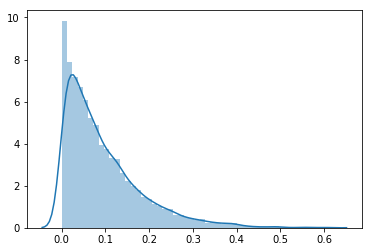

In [68]:
a,b,__,__ = scipy.stats.beta.fit(np.array(pack[0]['Channa striata'])[:,0])
print(a,b)
sns.distplot(np.random.beta(a,b,5000))

1.01483379788 10.9937124319


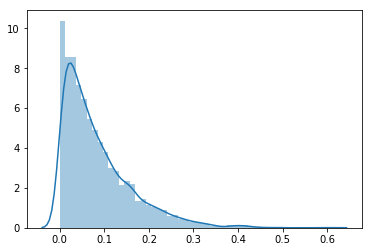

In [67]:
a,b = beta_with_fixed_mu_sd(np.array(pack[0]['Channa striata'])[:,0].mean(),np.array(pack[0]['Channa striata'])[:,0].std())
print(a,b)
sns.distplot(np.random.beta(a,b,5000))

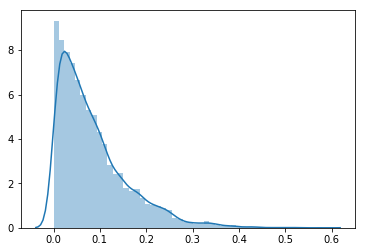

In [69]:
m = np.array(pack[0]['Channa striata'])[:,0].mean()
n = 13
alpha = n*m
beta = n*(1-m)
sns.distplot(np.random.beta(alpha,beta,5000))

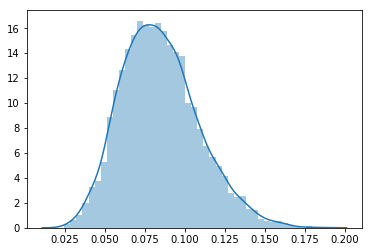

In [70]:
m = np.array(pack[0]['Channa striata'])[:,0].mean()
n = 130
alpha = n*m
beta = n*(1-m)
sns.distplot(np.random.beta(alpha,beta,5000))

# Successfully DEBUG
With the help of this post http://www.obscureanalytics.com/2012/07/04/to-the-basics-bayesian-inference-on-a-binomial-proportion/, I've modified the most relevant way to determine the hyper parameters for beta distribution. The results seemed much reasonable now!  

In [7]:
%store out_dict
%store out_dictII
%store pack

Stored 'out_dict' (dict)
Stored 'out_dictII' (dict)
Stored 'pack' (list)


In [2]:
%store -r

In [51]:
Legend